In [2]:
import sys
import os, PATH
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from src._configure import Yaml_configurer

sys.path.append(os.path.join(PATH.main_dir, "script"))

from script.main_train_with_PL_trainer import dl_from_config, get_model_from_config, get_sampler_from_configs
import PATH
from src import _diffplot as dfp
import pandas as pd

/home/wergillius/Project/diffuse_differentiate/script/path_n_util.py
/home/wergillius/Project/diffuse_differentiate/machine_config.json


In [4]:
PATH.main_dir

'/home/wergillius/Project/diffuse_differentiate'

In [5]:
adata = sc.read_h5ad(os.path.join(PATH.main_dir, "data/TFAtlas/differentiated_model_velo.h5ad"))

In [7]:
adata

AnnData object with n_obs × n_vars = 28825 × 4806
    obs: 'TF', 'batch', 'louvain', 'n_counts', 'n_genes', 'percent_mito', 'dpt_pseudotime', 'discrete_time', 'split', 'velocity_self_transition', 'is_large', 'Cluster Enriched TFs', 'course_louvain', 'course_cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Cluster Enriched TFs_colors', 'batch_colors', 'diffmap_evals', 'hvg', 'iroot', 'is_large_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'unique_token_dict', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_diffmap', 'X_pca', 'X_pca_harmony', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'X', 'velocity'
    obsp: 'connectivities', 'distances'

In [78]:
TF_summary = adata.obs.groupby(["TF", "louvain"]).agg({'dpt_pseudotime':"max",
                            "split" : 'count',
                             })
large_dpt_TF = TF_summary.dpt_pseudotime.nlargest(35).index

In [109]:
TF_summary

,dpt_pseudotime,split
TF,,
TFORF0001-HIF3A,NaN,0
TFORF0002-HIF3A,NaN,0
TFORF0003-HIF3A,NaN,0
TFORF0005-HIF3A,NaN,0
TFORF0007-TULP4,NaN,0
...,...,...
TFORF3546-TSC22D3,NaN,0
TFORF3547-CBFB,NaN,0
TFORF3548-THAP10,NaN,0


In [137]:
# find TFs that are enriched in the cluster

cluster_TF_ls = []

for cluster in adata.obs['louvain'].unique():
    
    df = adata.obs.query("`louvain` == @cluster")
    
    TF_summary = df.groupby("TF").agg(
                        {'dpt_pseudotime':"max",
                            "split" : 'count',
                             })
    enrich_TF = TF_summary.split.nlargest(3).index
    
    if "GFP" in enrich_TF:
        enrich_TF = list(TF_summary.split.nlargest(4).index)
        enrich_TF.remove('TFORF3549-GFP')
    
    for eTF in enrich_TF:
        if eTF not in cluster_TF_ls and 'GFP' not in eTF:
            cluster_TF_ls.append(eTF)

In [138]:
cluster_TF_ls

['TFORF0365-TCEB1',
 'TFORF0050-MAZ',
 'TFORF0297-CREM',
 'TFORF0987-KLF2',
 'TFORF0983-KLF5',
 'TFORF0984-KLF5',
 'TFORF2848-TCF21',
 'TFORF3361-MSC',
 'TFORF0926-ATOH7',
 'TFORF0988-KLF1',
 'TFORF0518-PAX5',
 'TFORF0537-PAX2',
 'TFORF0514-PAX5',
 'TFORF0985-KLF4',
 'TFORF0873-HOXB8',
 'TFORF0270-TCF7',
 'TFORF3363-NR5A1',
 'TFORF1447-NR5A2',
 'TFORF3131-NR5A2',
 'TFORF2883-BHLHA9',
 'TFORF2062-NKX2-6',
 'TFORF0098-MSGN1',
 'TFORF1324-KLF17',
 'TFORF2779-BATF',
 'TFORF0086-LIN28B',
 'TFORF2478-MESP1',
 'TFORF0391-FERD3L',
 'TFORF2496-ASCL3',
 'TFORF2498-ASCL4',
 'TFORF1216-NHLH1',
 'TFORF1159-EOMES',
 'TFORF2055-CDX1',
 'TFORF3008-CDX2',
 'TFORF1468-HOXD11',
 'TFORF0902-PTF1A',
 'TFORF1306-ZSCAN9',
 'TFORF2786-GLIS1',
 'TFORF2785-GLIS1',
 'TFORF0032-GSC2',
 'TFORF2168-GRHL3',
 'TFORF1167-EBF3',
 'TFORF2165-GRHL3',
 'TFORF0693-HNF4A',
 'TFORF0694-HNF4A',
 'TFORF0692-HNF4A',
 'TFORF1328-TFAP2A',
 'TFORF1829-DMRTA2',
 'TFORF0607-CREBL2',
 'TFORF2744-T',
 'TFORF1550-TAZ',
 'TFORF2078-FLI1

In [139]:
def is_large(tf):
    if tf in cluster_TF_ls:
        return tf
    else:
        return 'others'

adata.obs['Cluster Enriched TFs'] = adata.obs.TF.apply(is_large)

In [147]:
adata.uns['Cluster Enriched TFs_colors'][-1] = '#d4d2d2'

In [144]:
import matplotlib.pyplot as plt

In [152]:
idxs = adata.obs.query("`Cluster Enriched TFs` == 'others'").index
oidxs = adata.obs.query("`Cluster Enriched TFs` != 'others'").index

In [153]:
a = np.concatenate([idxs, oidxs], axis=0)

In [156]:
adata.uns['Cluster Enriched TFs_colors']

['#ffff00',
 '#1ce6ff',
 '#ff34ff',
 '#ff4a46',
 '#008941',
 '#006fa6',
 '#a30059',
 '#ffdbe5',
 '#7a4900',
 '#0000a6',
 '#63ffac',
 '#b79762',
 '#004d43',
 '#8fb0ff',
 '#997d87',
 '#5a0007',
 '#809693',
 '#6a3a4c',
 '#1b4400',
 '#4fc601',
 '#3b5dff',
 '#4a3b53',
 '#ff2f80',
 '#61615a',
 '#ba0900',
 '#6b7900',
 '#00c2a0',
 '#ffaa92',
 '#ff90c9',
 '#b903aa',
 '#d16100',
 '#ddefff',
 '#000035',
 '#7b4f4b',
 '#a1c299',
 '#300018',
 '#0aa6d8',
 '#013349',
 '#00846f',
 '#372101',
 '#ffb500',
 '#c2ffed',
 '#a079bf',
 '#cc0744',
 '#c0b9b2',
 '#c2ff99',
 '#001e09',
 '#00489c',
 '#6f0062',
 '#0cbd66',
 '#eec3ff',
 '#456d75',
 '#b77b68',
 '#7a87a1',
 '#788d66',
 '#885578',
 '#fad09f',
 '#ff8a9a',
 '#d4d2d2']

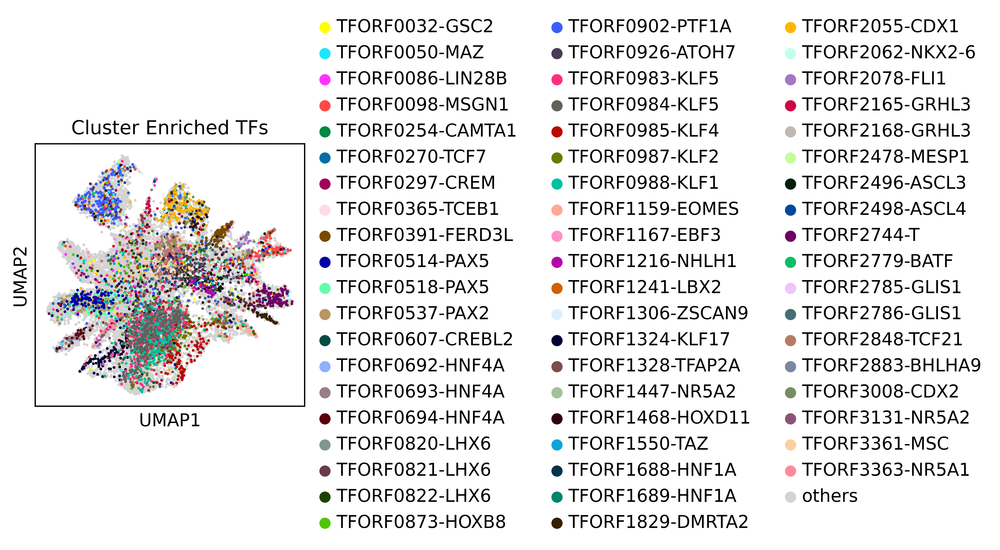

In [155]:
fig, ax = plt.subplots(1,1, figsize=(3,3), dpi=300)
sc.pl.umap(adata[a], 
           size = 12, color="Cluster Enriched TFs", 
           ax=ax, return_fig = False)

# **Course Annotation**

In [159]:
marker_gene_expression = [
    'POU5F1', 'SOX17', 'NANOG', 'NANOS3', 'TFAP2C', # psc-like
    'L1TD1', 'TERF1', 'DNMT3B', 'SEMA6A', 'NES', # psc-ect
    'KRT8', 'KRT18', 'CDH1', 'TFAP2A', 'PTN', # tb-like
    'APOA1', 'APOA2', 'APOE', 'AFP', 'KRT19', # yse
    'KCNQ1OT1', 'SNHG14', 'DST', 'PRTG', 'TBX3', # ect-like
    'SFRP2', 'GPC3', 'PAX6', 'FZD3', 'SOX2', # ne-like
    'PLP1', 'FOXD3', 'PAX3', 'SOX10', 'SOX11', # nc
    'PITX1', 'TMEM88', 'HAND1', 'BMP4', 'ACTC1', # mes-like
    'NKX2-5', 'MSX1', 'MSX2', 'MDK', 'ID3', # cm-like
    'ANGPT1', 'HGF', 'FBN1', 'ITGA1', 'MME', # fibro
    'KDR', 'CDH5', 'PECAM1', 'VWF', 'CD34', # endo
    'RUNX1', 'IL5RA', 'ITGB2', 'CEBPB', 'IFI6', # hpc
    'HBZ', 'HBA1', 'HBA2', 'GYPA', 'TFRC', # ery
    'PF4', 'PPBP', 'GP9', 'PLEK', 'THBS1', # mk
    'GYPB', 'GIHCG', 'HDC', 'ARHGDIB', 'GMFG', # mep
    'PRG3', 'PRG2', 'EPX', 'PRSS57', 'MS4A3', # mp-1
    'LMO4', 'GATA2', 'PTPRC', 'KCNK17', 'FCER1G', # mp-2
    'C1QB', 'CD14', 'S100A9', 'S100B', 'CEBPD' # mono
]

In [162]:
overlap = np.intersect1d(adata.var_names,marker_gene_expression)

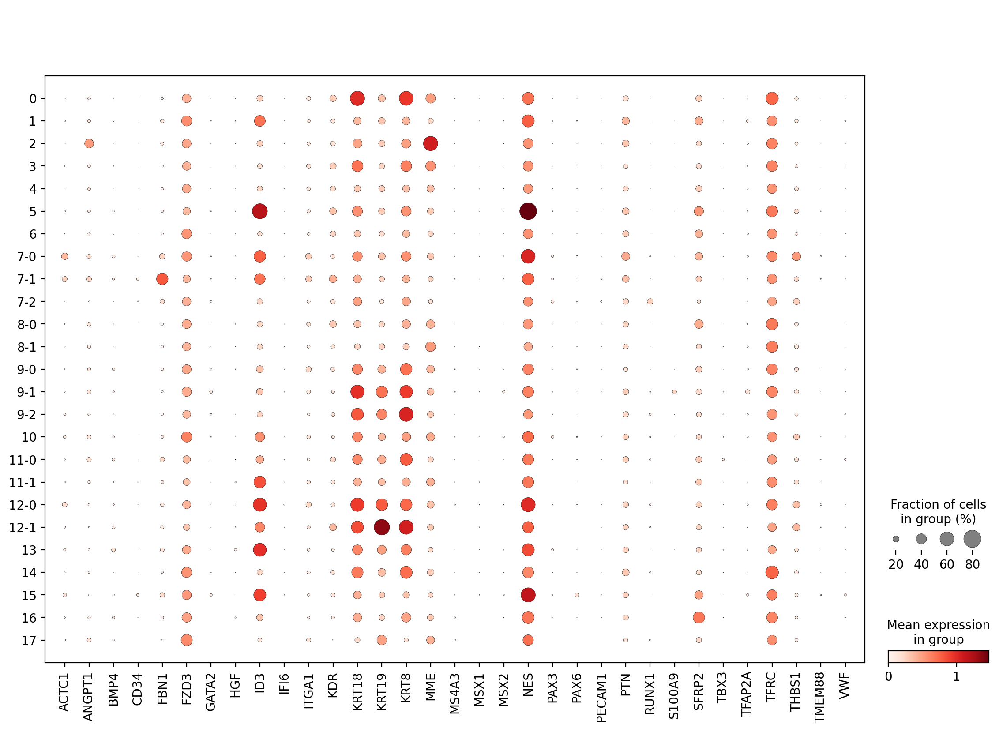

In [ ]:
sc.pl.dotplot(adata, var_names=overlap, groupby='louvain')

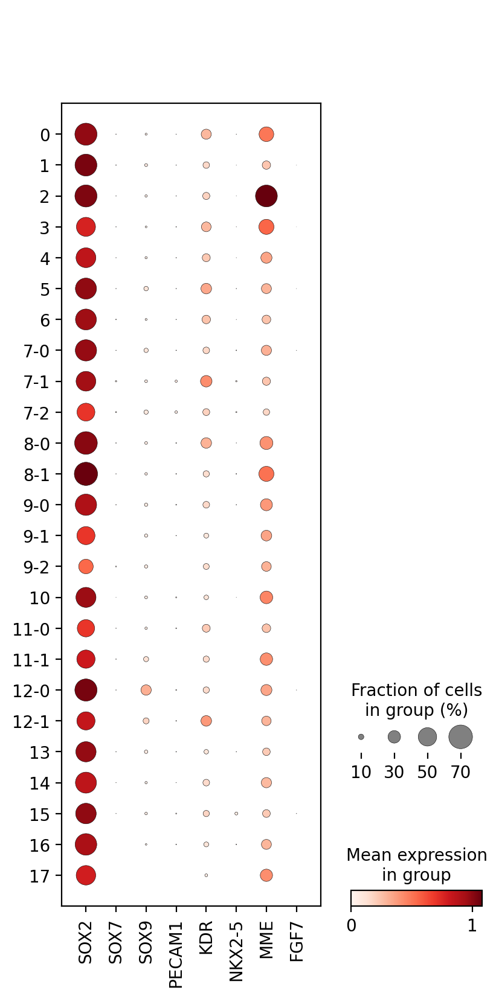

In [166]:
sc.pl.dotplot(adata, var_names=['SOX2', 'SOX7', 'SOX9', 
                               'PECAM1', 'KDR', 
                               'NKX2-5', 
                               'MME', 'FGF7'], groupby='louvain')

In [168]:
sc.tl.rank_genes_groups(adata, groupby='louvain')

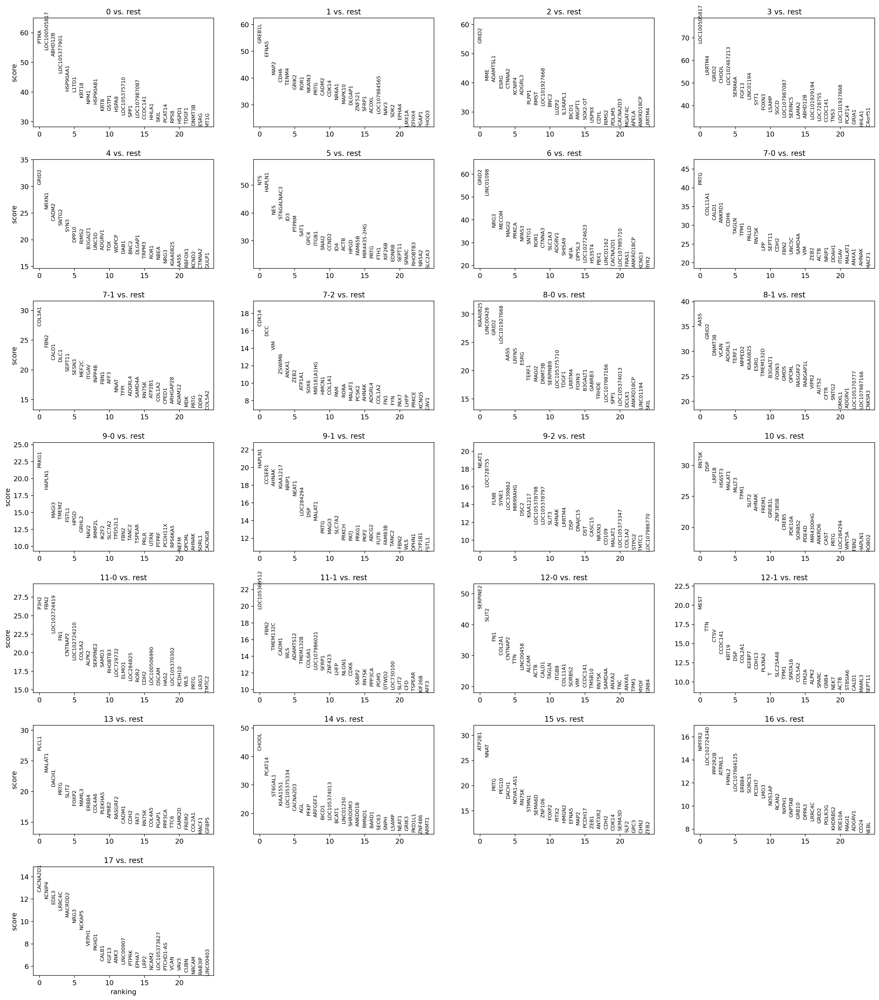

In [169]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [173]:
YM_annotaion = {
    "0": "stromal_1",
    "1": "stromal_2 / endo",
    "2": "fibroblast_1",
    "3": "endoderm_1",
    "4": "stromal_3",
    "5": "ectoderm_1",
    "6": "stromal_3",
    "7": "fibroblast_2",
    "8": "endoderm_2",
    "9": "stromal_4",
    "10": "stromal_5",
    "11": "fibroblast_3",
    "12": "fibroblast_4",
    "13": "ectoderm_2",
    "14": "ectoderm_3",
    "15": "ectoderm_4",
    "16": "squamous epithelial",
    "17": "ectoderm_5"
}

In [171]:
adata.obs['course_louvain'] = adata.obs['louvain'].apply(lambda x: x.split("-")[0])
adata.obs['course_cell_type'] = adata.obs['course_louvain'].map(YM_annotaion)

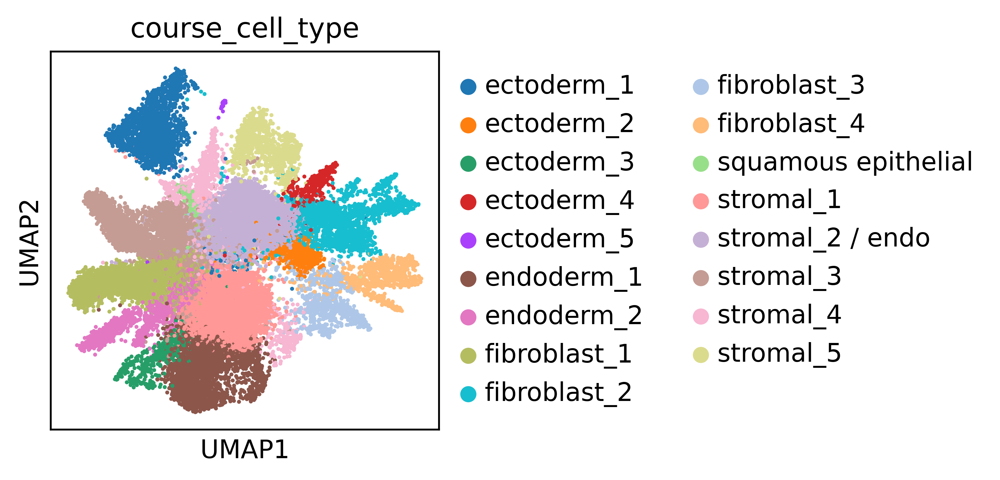

In [177]:
fig, ax = plt.subplots(1,1, figsize=(3,3), dpi=300)
sc.pl.umap(adata[a], 
           size = 12, color="course_cell_type", 
           ax=ax, return_fig = False)

In [178]:
adata.write_h5ad(os.path.join(PATH.main_dir, "data/TFAtlas/differentiated_model_velo.h5ad"))

# **Cell rank**

In [183]:
from cellrank.tl.kernels import VelocityKernel

In [186]:
class MyKernel(cr.tl.kernels.Kernel):
    def compute_transition_matrix(self, some_parameter: float = 0.5) -> "MyKernel":
        transition_matrix = self.adata.uns['velocity_graph']
        self._compute_transition_matrix(transition_matrix, density_normalize=True)
        return self

    def copy(self) -> "MyKernel":
        return copy(self)

In [187]:
k = MyKernel(adata).compute_transition_matrix()
k.transition_matrix.A

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [189]:
from cellrank.tl.kernels import ConnectivityKernel

ck = ConnectivityKernel(adata).compute_transition_matrix()

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


In [191]:
combined_kernel = 0.8 * k + 0.2 * ck

In [192]:
from cellrank.tl.estimators import GPCCA

g = GPCCA(combined_kernel)
print(g)

GPCCA[n=28825, kernel=((0.8 * <MyKernel>) + (0.2 * <ConnectivityKernel[dnorm=True, key=connectivities]>))]


Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[2]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:16)


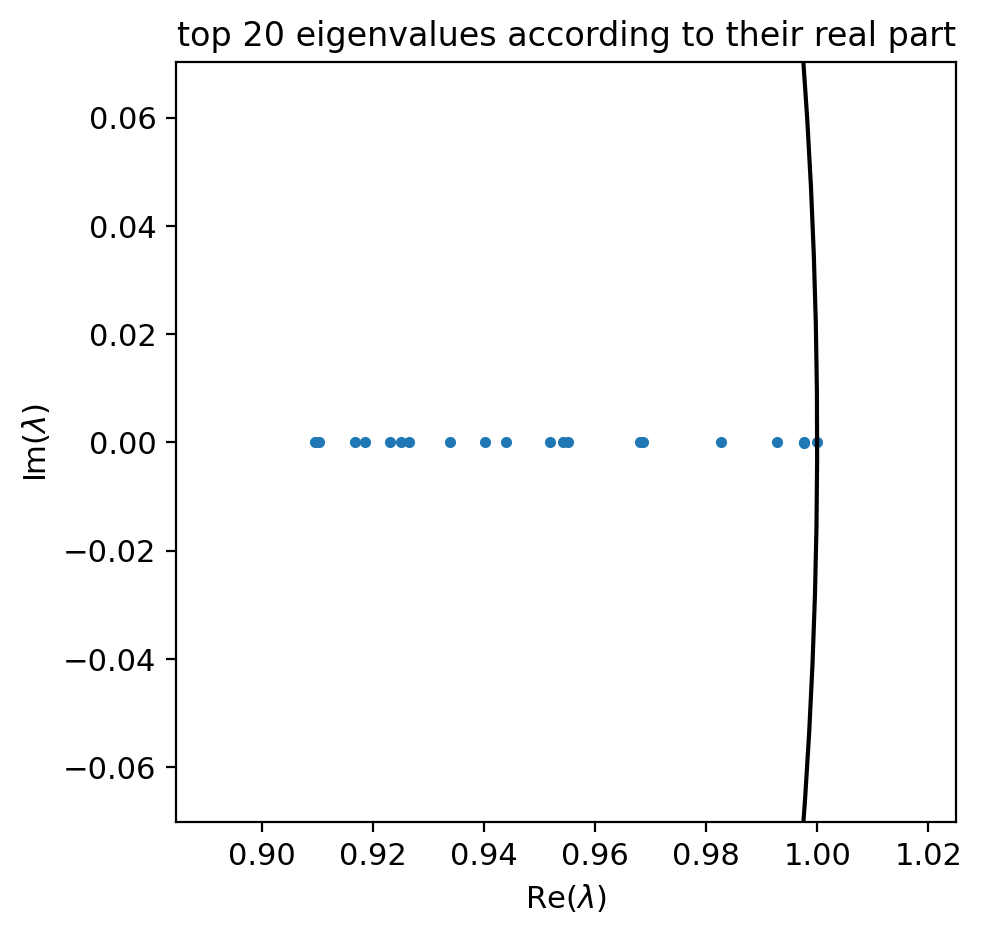

In [193]:
g.compute_schur(n_components=20)
g.plot_spectrum()

Computing `3` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:05)


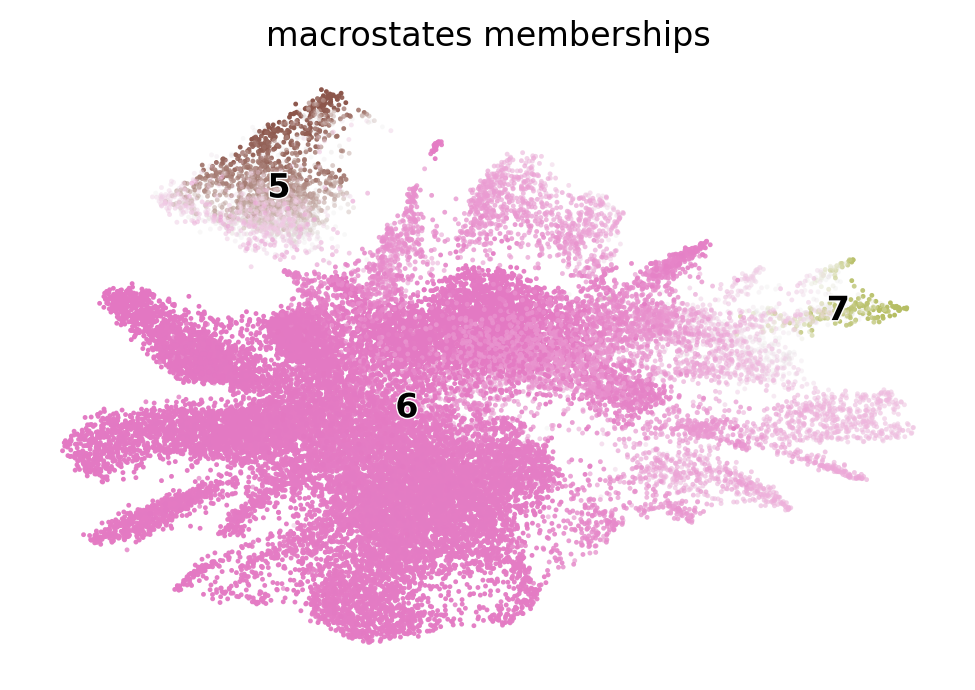

In [194]:
g.compute_macrostates(n_states=3, cluster_key="course_louvain")
g.plot_macrostates()

/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


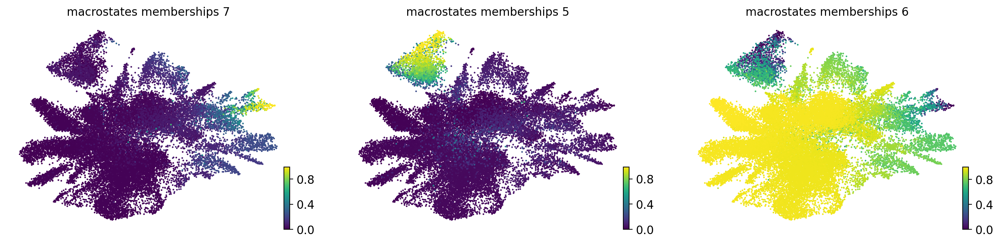

In [195]:
g.plot_macrostates(same_plot=False)

In [1]:
g.compute_terminal_states()

NameError: name 'g' is not defined

In [197]:
g.compute_absorption_probabilities(use_petsc=True, solver='gmres')

Computing absorption probabilities


100%|██████████| 3/3 [00:04<00:00,  1.64s/]


Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:05)


In [221]:
adata.obs['terminal_states_probs']

R1.11,R2.75,R3.53,P1.54-0-1-0    0.993039
R1.57,R2.65,R3.85,P1.62-1-1-0    0.975614
R1.36,R2.43,R3.03,P1.07-2-1-0    0.963847
R1.30,R2.78,R3.32,P1.31-1-2-0    0.981631
R1.87,R2.31,R3.93,P1.31-1-2-0    0.966707
                                   ...   
R1.09,R2.52,R3.46,P1.38-2-1      0.889684
R1.27,R2.20,R3.51,P1.38-2-1      0.641534
R1.55,R2.61,R3.86,P1.38-2-1      0.819259
R1.29,R2.64,R3.18,P1.62-3-1      0.731938
R1.52,R2.33,R3.67,P1.62-3-1      0.739879
Name: terminal_states_probs, Length: 28825, dtype: float64

In [224]:
g.absorption_probabilities

7,5,6
0.462244,0.333546,0.204210
0.520914,0.389737,0.089349
0.510700,0.392507,0.096793
0.534018,0.383973,0.082010
0.507752,0.390490,0.101758
0.507398,0.386658,0.105943
0.522506,0.388079,0.089415
0.517215,0.391874,0.090912
0.512803,0.395074,0.092124
0.513628,0.378130,0.108243


In [223]:
adata.obs['member_7_absorption'] =g.absorption_probabilities.X[:,0]

In [225]:
adata.obs['member_5_absorption'] =g.absorption_probabilities.X[:,1]

In [226]:
adata.obs['member_6_absorption'] =g.absorption_probabilities.X[:,2]

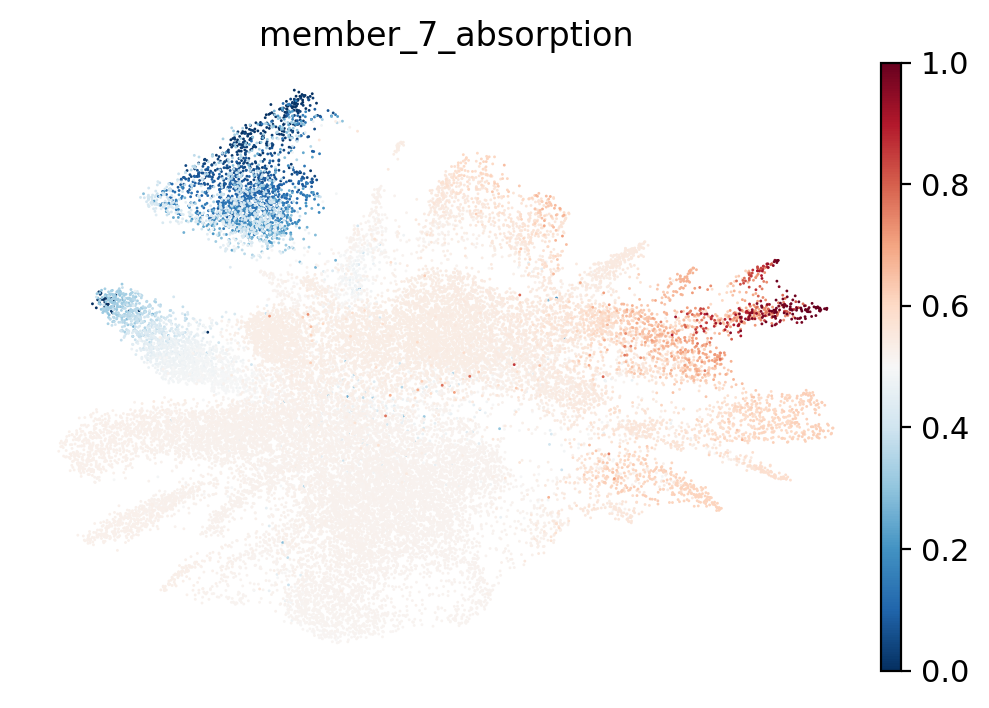

In [233]:
fig, ax = plt.subplots(1,1)
sc.pl.umap(adata, color = ['member_7_absorption'], 
           ax=ax, frameon = False, return_fig=False)


/home/wergillius/.conda/envs/GenDiff/lib/python3.8/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


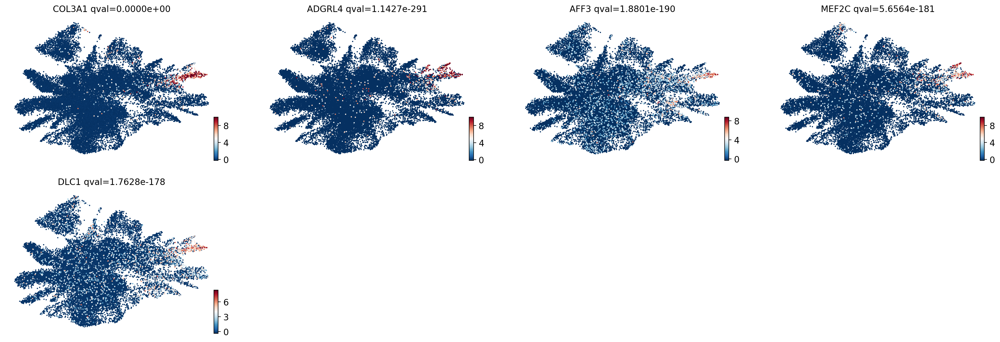

In [199]:
g.plot_lineage_drivers("7", n_genes=5)

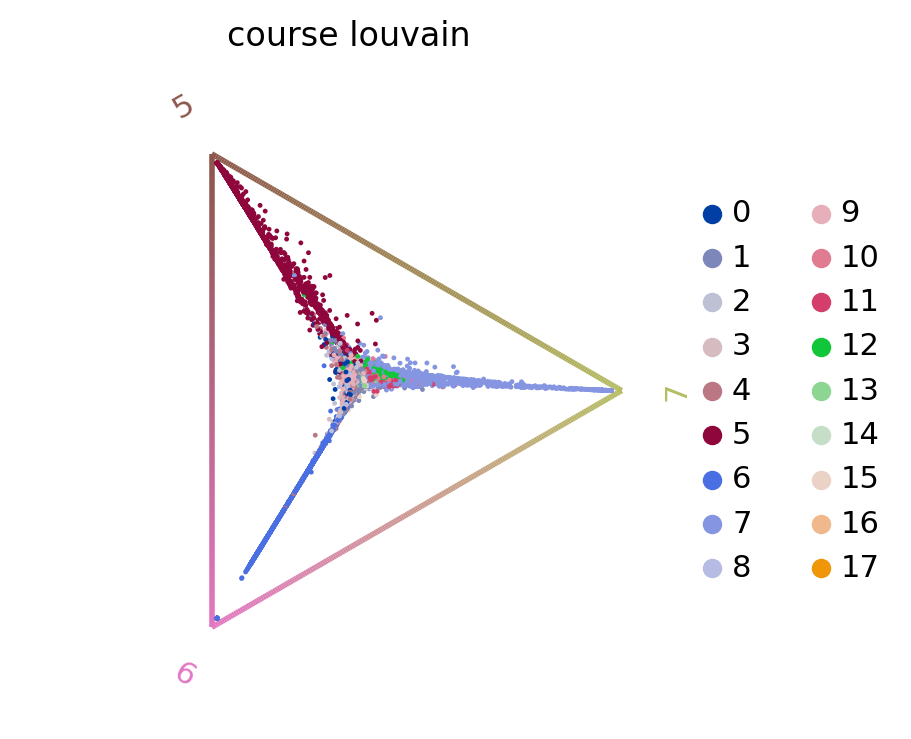

In [200]:
cr.pl.circular_projection(adata, keys="course_louvain", legend_loc="right")

## some driver genes

In [198]:
alpha_drivers = g.compute_lineage_drivers(lineages="7", return_drivers=True)
alpha_drivers.sort_values(by="7_corr", ascending=False)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:14)


,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
COL3A1,0.260075,0.000000e+00,0.000000e+00,0.249279,0.270806
ADGRL4,0.212673,2.615438e-294,1.142709e-291,0.201624,0.223668
AFF3,0.172753,7.041743e-193,1.880145e-190,0.161530,0.183930
MEF2C,0.168460,2.471583e-183,5.656395e-181,0.157222,0.179655
DLC1,0.167310,8.069199e-181,1.762753e-178,0.156067,0.178510
...,...,...,...,...,...
SNAI2,-0.240357,0.000000e+00,0.000000e+00,-0.251205,-0.229450
ZNF804A,-0.254155,0.000000e+00,0.000000e+00,-0.264922,-0.243325
HAPLN1,-0.308507,0.000000e+00,0.000000e+00,-0.318915,-0.298024
TBX15,-0.320628,0.000000e+00,0.000000e+00,-0.330947,-0.310232


In [213]:
np.intersect1d(g.lineage_drivers.index, ["NR2F2", "EPHB4", "NRP2", "APLNR"])

array(['APLNR', 'NR2F2', 'NRP2'], dtype=object)

In [218]:
np.intersect1d(g.lineage_drivers.index, ["GATA2", "RUNX1"])

array(['GATA2', 'RUNX1'], dtype=object)

In [216]:
np.intersect1d(g.lineage_drivers.index, ["SOX17", "GJA5", "EFNB2", "DLL4", "HEY1", "HEY2", "HES4"])

array(['EFNB2', 'HEY1'], dtype=object)

In [219]:
g.lineage_drivers.loc[["GATA2", "RUNX1"]]

,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
GATA2,-0.005879,3.182524e-01,4.824630e-01,-0.017422,0.005666
RUNX1,0.038101,9.699434e-11,8.812000e-10,0.026568,0.049623


In [215]:
g.lineage_drivers.loc[['APLNR', 'NR2F2', 'NRP2']]

,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
APLNR,0.083512,7.837283e-46,2.875266e-44,0.072037,0.094965
NR2F2,0.080640,7.703461e-43,2.553299e-41,0.069160,0.092098
NRP2,0.037889,1.230251e-10,1.109303e-09,0.026356,0.049412


In [217]:
g.lineage_drivers.loc[['EFNB2', 'HEY1']]

,7_corr,7_pval,7_qval,7_ci_low,7_ci_high
EFNB2,0.049088,7.406971e-17,1.019997e-15,0.037565,0.060598
HEY1,-0.119668,1.256100e-92,1.207364e-90,-0.131032,-0.108274


# others

In [57]:
# index, remove batch label 
cell_type = pd.read_table(os.path.join(PATH.main_dir, "data/TFAtlas/knn_pred.txt"))
cbindex=cell_type.CB.apply(lambda x:x.replace("-TF_atlas",""))

# remove organ 
pred = cell_type['cell type'].apply(lambda x: x.split("-")[1]).values
adata_TF.obs.loc[cbindex, 'cell_type'] = pred

In [ ]:
from sklearn.metrics.pairwise import cosine_distances

distances = 1 - cosine_distances(
    adata_merged[adata_merged.obs['sample'] == "pbmc3k"].obsm["Scanorama"],
    adata_merged[adata_merged.obs['sample'] == "ctrl"].obsm["Scanorama"],
)

In [ ]:
def label_transfer(dist, labels, index):
    lab = pd.get_dummies(labels)
    class_prob = lab.to_numpy().T @ dist
    norm = np.linalg.norm(class_prob, 2, axis=0)
    class_prob = class_prob / norm
    class_prob = (class_prob.T - class_prob.min(1)) / class_prob.ptp(1)
    # convert to df
    cp_df = pd.DataFrame(
        class_prob, columns=lab.columns
    )
    cp_df.index = index
    # classify as max score
    m = cp_df.idxmax(axis=1)
    
    return m